## Packages

In [193]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from IPython.core.display import display, HTML

## Import Dataset

In [194]:
absolute_part = 'C:\\Users\\usisavac\\Python\\Diplomski_Rad\\'

path_1 = absolute_part + 'data\\portal_articles_classes_.csv'
path_2 = absolute_part + 'data\\portal_articles_covid_positivity_vader.csv'
path_3 = absolute_part + 'data\\portal_articles_covid.csv'

df_1 = pd.read_csv(path_1)
df_2 = pd.read_csv(path_2)

df_1.info()
df_2.info()

df = df_1

df.insert(23, 'Title_positivity_vader', df_2['Title_positivity_vader'].astype(float))
df.insert(24, 'Subtitle_positivity_vader', df_2['Subtitle_positivity_vader'].astype(float))
df.insert(25, 'Text_positivity_vader', df_2['Text_positivity_vader'].astype(float))

df_normal_names = pd.read_csv(path_3)

df['Title'] = df_normal_names['Title']
df['Subtitle'] = df_normal_names['Subtitle']
df['Article_text'] = df_normal_names['Article_text']

df.info()

df.to_csv(absolute_part + 'data\\portal_articles_final.csv', sep=',', index=False, header=True, encoding='utf-8')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3392 entries, 0 to 3391
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            3392 non-null   int64  
 1   Title                         3392 non-null   object 
 2   Subtitle                      3392 non-null   object 
 3   URL                           3392 non-null   object 
 4   Section                       3392 non-null   object 
 5   Article_text                  3392 non-null   object 
 6   Published_time                3392 non-null   object 
 7   Modified_time                 1115 non-null   object 
 8   Author                        3392 non-null   object 
 9   Comments                      3392 non-null   int64  
 10  Reaction_love                 3392 non-null   int64  
 11  Reaction_laugh                3392 non-null   int64  
 12  Reaction_hug                  3392 non-null   int64  
 13  Rea

In [195]:
df = pd.read_csv(absolute_part+'data\\portal_articles_final.csv')

## Article Count by Positivity

In [196]:
df.Positivity.value_counts(ascending=True)

NEUTRAL      123
POSITIVE     998
NEGATIVE    2271
Name: Positivity, dtype: int64

## Emoji Total Count

Text(0, 0.5, 'Total Emoji Count')

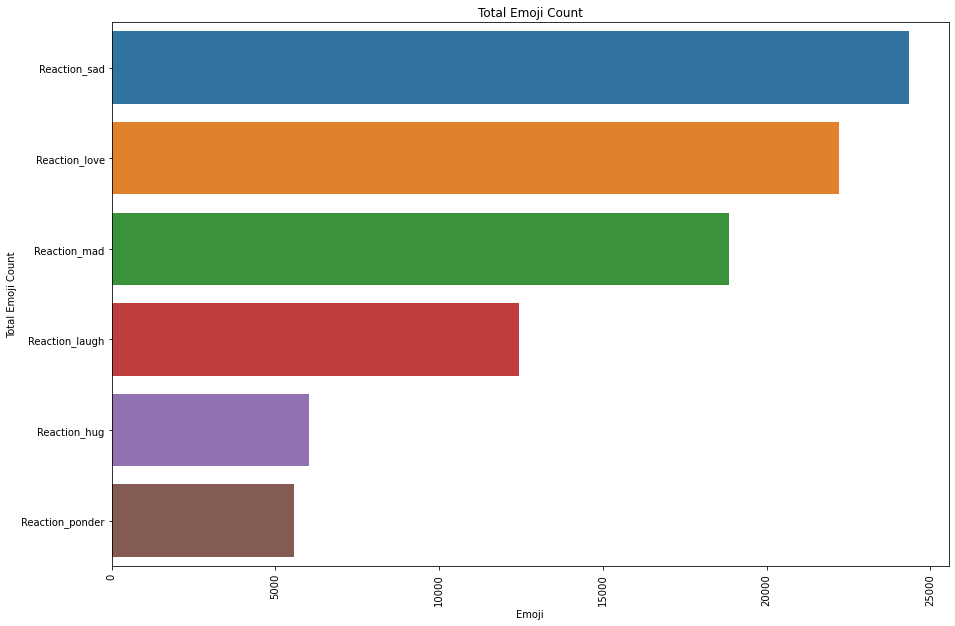

In [197]:
series_emojis = df.iloc[:,10:16].sum().sort_values(ascending=False)
sns.barplot(y = series_emojis.index, x = series_emojis.values)

fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.xticks(rotation=90, fontsize = 10)
plt.title('Total Emoji Count')
plt.xlabel('Emoji')
plt.ylabel('Total Emoji Count')

## Article Quantification by Category

In [198]:
pd.crosstab(df.Section, df.Positivity.count()).sort_values(df.Positivity.count(), ascending=False)

col_0,3392
Section,
Vijesti,1564
Dalmacija,1286
Relax,288
Sport,189
Hrvatska,19
Kolumne,19
Izbori-2021,9
Specijali,8
Split,4


## Positivity by category

Text(0, 0.5, 'Number of Articles')

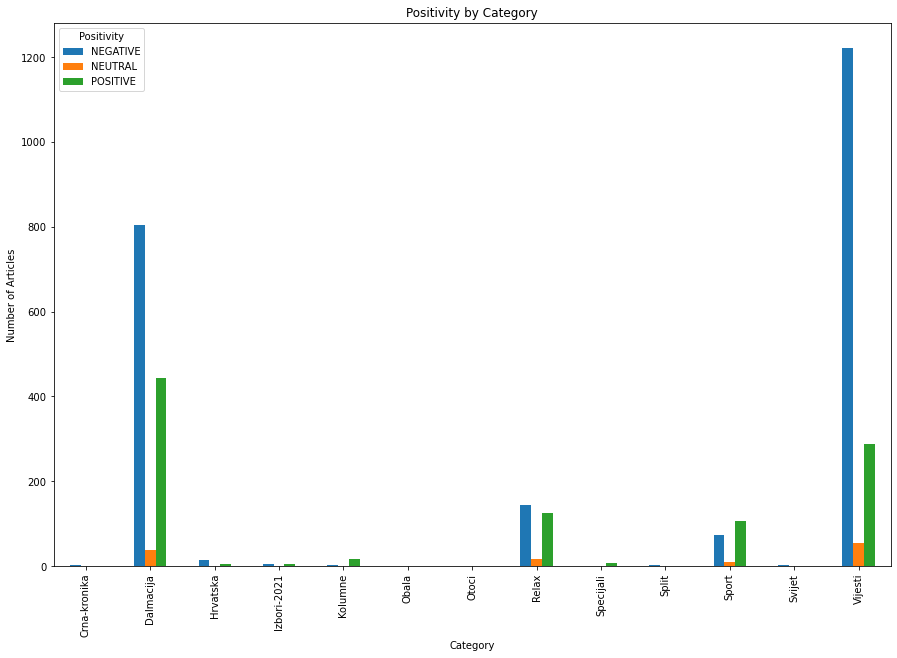

In [199]:
pd.crosstab(df.Section, df.Positivity).plot.bar()

fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.xticks(rotation=90, fontsize = 10)
plt.title('Positivity by Category')
plt.xlabel('Category')
plt.ylabel('Number of Articles')


## Total Emoji Sum by Category

In [200]:
df_total_emoji_sum_by_category = df.groupby('Section').agg({
    'Reaction_love' : ['sum'], 
    'Reaction_laugh' : ['sum'],
    'Reaction_hug' : ['sum'],
    'Reaction_ponder' : ['sum'],
    'Reaction_sad' : ['sum'],
    'Reaction_mad' : ['sum']
    })

df_total_emoji_sum_by_category.to_html(absolute_part+'\\tables\\total_emoji_sum_by_category.html')
df_total_emoji_sum_by_category


,Reaction_love,Reaction_laugh,Reaction_hug,Reaction_ponder,Reaction_sad,Reaction_mad
,sum,sum,sum,sum,sum,sum
Section,,,,,,
Crna-kronika,2,5,2,4,192,15
Dalmacija,14280,5158,3330,2803,14343,10652
Hrvatska,117,50,38,39,128,295
Izbori-2021,91,74,10,37,11,21
Kolumne,243,35,59,17,35,15
Obala,4,35,2,43,48,138
Otoci,4,3,1,2,1,2
Relax,2358,2634,701,445,960,811


## Mean Emoji Value by Category

In [201]:
mean_emoji_value_by_category = df.groupby('Section').agg({
    'Reaction_love' : ['mean'], 
    'Reaction_laugh' : ['mean'],
    'Reaction_hug' : ['mean'],
    'Reaction_ponder' : ['mean'],
    'Reaction_sad' : ['mean'],
    'Reaction_mad' : ['mean']
    })

mean_emoji_value_by_category.to_html(absolute_part+'\\tables\\mean_emoji_value_by_category.html')
display(HTML(mean_emoji_value_by_category.to_html()))

,Reaction_love,Reaction_laugh,Reaction_hug,Reaction_ponder,Reaction_sad,Reaction_mad
,mean,mean,mean,mean,mean,mean
Section,,,,,,
Crna-kronika,1.000000,2.500000,1.000000,2.000000,96.000000,7.500000
Dalmacija,11.104199,4.010886,2.589425,2.179627,11.153188,8.283048
Hrvatska,6.157895,2.631579,2.000000,2.052632,6.736842,15.526316
Izbori-2021,10.111111,8.222222,1.111111,4.111111,1.222222,2.333333
Kolumne,12.789474,1.842105,3.105263,0.894737,1.842105,0.789474
Obala,4.000000,35.000000,2.000000,43.000000,48.000000,138.000000
Otoci,4.000000,3.000000,1.000000,2.000000,1.000000,2.000000
Relax,8.187500,9.145833,2.434028,1.545139,3.333333,2.815972


## Outlier Cleaning

In [202]:
def clean_outliers(df, column, min_quan, max_quan):
    df[column] = np.where(df[column] < df[column].quantile(min_quan), df[column].quantile(min_quan),df[column])
    df[column] = np.where(df[column] > df[column].quantile(max_quan), df[column].quantile(max_quan),df[column])

    print('\n',df[column].describe())


clean_outliers(df, 'Text_positivity', 0.10, 0.90)
clean_outliers(df, 'Text_positivity_sentence', 0.10, 0.90)

clean_outliers(df, 'Title_positivity', 0.10, 0.90)
clean_outliers(df, 'Title_positivity_sentence', 0.10, 0.90)

clean_outliers(df, 'Subtitle_positivity', 0.10, 0.90)
clean_outliers(df, 'Subtitle_positivity_sentence', 0.10, 0.90)


 count    3392.000000
mean        0.002022
std         0.004960
min        -0.004952
25%        -0.001925
50%         0.001366
75%         0.005545
max         0.010896
Name: Text_positivity, dtype: float64

 count    3367.000000
mean       -0.997672
std         1.234012
min        -3.431536
25%        -1.820377
50%        -0.454897
75%         0.041558
max         0.165583
Name: Text_positivity_sentence, dtype: float64

 count    3392.000000
mean        0.007348
std         0.018367
min        -0.018759
25%        -0.005761
50%         0.004412
75%         0.017831
max         0.042300
Name: Title_positivity, dtype: float64

 count    3392.000000
mean        0.041839
std         0.298793
min        -0.501632
25%        -0.123382
50%         0.038555
75%         0.223981
max         0.542568
Name: Title_positivity_sentence, dtype: float64

 count    3392.000000
mean        0.003245
std         0.015121
min        -0.020166
25%        -0.007282
50%         0.001915
75%         0.012257

## Tablica - Mjesečna kvota negativnih, pozitivnih i neutralnih i prosječna pozitivnost

In [203]:
# Define a new dataframe using initial dataframe
df_month = df

df_month['Month'] = pd.DatetimeIndex(df_month['Published_time']).month
df_month['Year'] = pd.DatetimeIndex(df_month['Published_time']).year

df_month['Month/Year'] = (df_month.Year.astype(str) + '/' + df_month.Month.astype(str))
df_month['Month/Year'].unique()

df_month['Positivity_neu'] = df_month['Positivity']
df_month['Positivity_neg'] = df_month['Positivity']
df_month['Positivity_pos'] = df_month['Positivity']

article_month = df_month.pivot_table(index = ['Month/Year'], 
                                            aggfunc = {
                                            'Positivity_neg':lambda x: (x  ==  'NEGATIVE').sum(),
                                            'Positivity_neu':lambda x: (x  ==  'NEUTRAL').sum(),
                                            'Positivity_pos':lambda x: (x  ==  'POSITIVE').sum()}) 

article_month.index.name = 'Month/Year'

article_month.index = pd.Categorical(article_month.index,['2020/3','2020/4','2020/5','2020/6','2020/9','2020/10','2020/11',
'2020/12','2021/1','2021/2','2021/3','2021/4'], ordered=True) 

article_month.sort_index(inplace=True)
article_month




,Positivity_neg,Positivity_neu,Positivity_pos
2020/3,0,0,1
2020/4,3,0,0
2020/5,0,1,1
2020/6,0,0,1
2020/9,1,0,3
2020/10,291,13,91
2020/11,487,30,192
2020/12,427,21,208
2021/1,300,12,144
2021/2,252,15,156


Text(0, 0.5, 'Positivity Count by N/N/P')

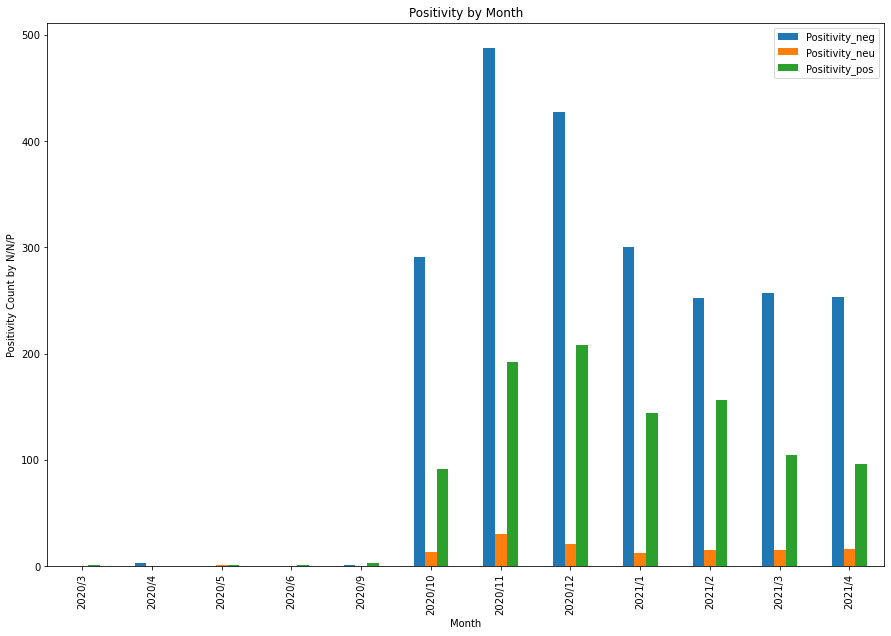

In [204]:
article_month.plot.bar()

fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.xticks(rotation=90, fontsize = 10)
plt.title('Positivity by Month')
plt.xlabel('Month')
plt.ylabel('Positivity Count by N/N/P')

## Data Normalization

* Data is normalized in range (-1,1) for sentiment positivity columns
* NaN values are dropped separately


In [205]:

df_text = df

df_text.dropna(subset = ['Text_positivity','Text_positivity_sentence', 'Text_positivity_vader'], inplace=True)

df_text[['Text_positivity', 'Text_positivity_sentence', 'Text_positivity_vader']] = MinMaxScaler(feature_range=(-1,1)).fit_transform(df_text[['Text_positivity', 'Text_positivity_sentence', 'Text_positivity_vader']])
df_text[['Text_positivity', 'Text_positivity_sentence', 'Text_positivity_vader']].describe()


,Text_positivity,Text_positivity_sentence,Text_positivity_vader
count,3341.000000,3341.000000,3341.000000
mean,-0.120868,0.351009,0.127845
std,0.627572,0.686586,0.312742
min,-1.000000,-1.000000,-1.000000
25%,-0.622757,-0.106015,-0.077903
50%,-0.197835,0.651826,0.133821
75%,0.325738,0.930545,0.334987
max,1.000000,1.000000,1.000000


In [206]:

df_title = df
df_title.dropna(subset = ['Title_positivity','Title_positivity_sentence', 'Title_positivity_vader'], inplace=True)

df_title[['Title_positivity', 'Title_positivity_sentence','Title_positivity_vader']] = MinMaxScaler(feature_range=(-1,1)).fit_transform(df_title[['Title_positivity', 'Title_positivity_sentence','Title_positivity_vader']])
df_title[['Title_positivity', 'Title_positivity_sentence','Title_positivity_vader']].describe()



,Title_positivity,Title_positivity_sentence,Title_positivity_vader
count,2210.000000,2210.000000,2210.000000
mean,-0.173830,0.007688,-0.031842
std,0.613966,0.599378,0.528380
min,-1.000000,-1.000000,-1.000000
25%,-0.633802,-0.353484,-0.522148
50%,-0.272836,0.011812,-0.053709
75%,0.185404,0.393857,0.440162
max,1.000000,1.000000,1.000000


## Total Positivity Day-By-Day (Normalized)

### Day-By-Day - Article Text

Text(0, 0.5, 'Positivity Score')

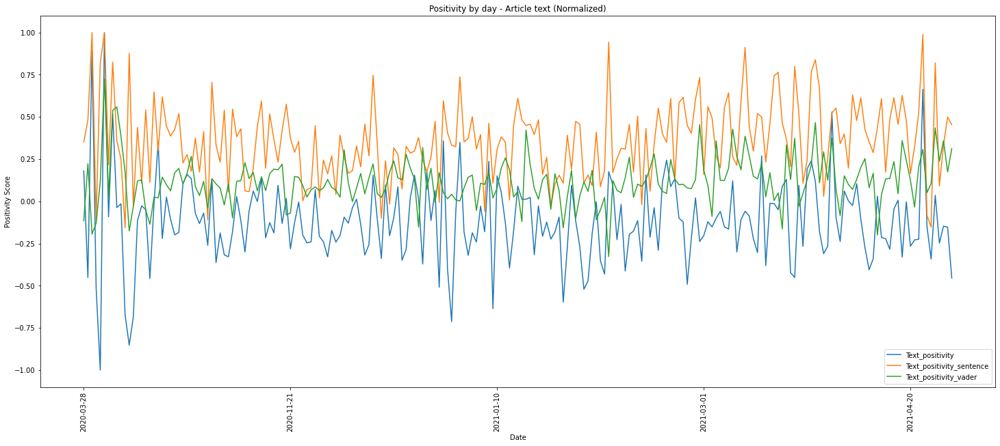

In [207]:
df_day = df_text.pivot_table(index = ['Published_time'], 
                                            aggfunc = {'Text_positivity':lambda x: x.mean(),
                                                'Text_positivity_sentence':lambda x: x.mean(), 
                                                'Text_positivity_vader':lambda x: x.mean()})
df_day.plot()
fig = plt.gcf()
fig.set_size_inches(25, 10)
plt.xticks(rotation=90, fontsize = 10)
plt.title('Positivity by day - Article text (Normalized)')
plt.xlabel('Date')
plt.ylabel('Positivity Score')

### Day-By-Day - Title

Text(0, 0.5, 'Positivity Score')

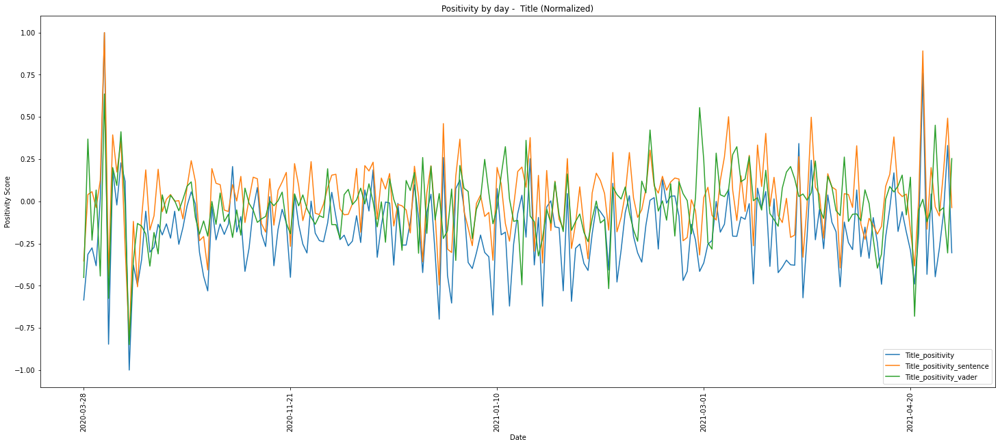

In [208]:
df_day_title = df_title.pivot_table(index = ['Published_time'], 
                                            aggfunc = {'Title_positivity':lambda x: x.mean(),
                                                'Title_positivity_sentence':lambda x: x.mean(), 
                                                'Title_positivity_vader':lambda x: x.mean()})
df_day_title.plot()
fig = plt.gcf()
fig.set_size_inches(25, 10)
plt.xticks(rotation=90, fontsize = 10)
plt.title('Positivity by day -  Title (Normalized)')
plt.xlabel('Date')
plt.ylabel('Positivity Score')

## Vader - Title


In [209]:
df_vader_positivity_title = df_title[['Title', 'URL', 'Title_positivity_vader','Positivity']]
df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=True).head(10).to_html(absolute_part+'\\tables\\df_vader_positivity_title_positive.html')

display(HTML(df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=True).head(10).to_html()))

,Title,URL,Title_positivity_vader,Positivity
3069,Pijetao ubio policajca koji je pokušao zaustaviti ilegalnu borbu pijetlova,https://www.dalmacijadanas.hr/pijetao-ubio-policajca-koji-je-pokusao-zaustaviti-ilegalnu-borbu-pijetlova/,-1.000000,NEGATIVE
1736,"SERIJSKI UBOJICA UMRO OD KORONE Ubio je čak 17 ljudi, zvali su ga ‘monstrum vlakova’",https://www.dalmacijadanas.hr/serijski-ubojica-umro-od-korone-ubio-je-cak-17-ljudi-zvali-su-ga-monstrum-vlakova/,-0.998511,NEGATIVE
3050,"Uhićen muškarac koji je Berošu prijetio putem interneta, evo kolika je kazna za širenje govora mržnje",https://www.dalmacijadanas.hr/uhicen-muskarac-koji-je-berosu-prijetio-putem-interneta-evo-kolika-je-kazna-za-sirenje-govora-mrznje/,-0.992130,NEGATIVE
1459,UGOSTITELJIMA PREKIPJELO Medak i Jakominić odstupili: “Ljudi su bijesni jer ih se dugo zavaravalo”,https://www.dalmacijadanas.hr/ugostiteljima-prekipjelo-medak-i-jakominic-odstupili-ljudi-su-bijesni-jer-ih-se-dugo-zavaravalo/,-0.982983,NEGATIVE
1364,"PROPUST LIJEČNIKA IZ DALMACIJE “Moj djed je umirao u mukama, a liječnik iz Hitne mi je prijetio policijom”",https://www.dalmacijadanas.hr/propust-lijecnika-iz-dalmacije-moj-djed-je-umirao-u-mukama-a-lijecnik-iz-hitne-mi-je-prijetio-policijom/,-0.980963,NEGATIVE
2341,"Upozorenje Vladi: “Ograničenog rada poslodavci trpe goleme gubitke, a potpunim zatvaranjem poslovno stanje postat će financijski neizdrživo”",https://www.dalmacijadanas.hr/upozorenje-vladi-ogranicenog-rada-poslodavci-trpe-goleme-gubitke-a-potpunim-zatvaranjem-poslovno-stanje-postat-ce-financijski-neizdrzivo/,-0.979474,POSITIVE
1212,Horvatinčić traži novu odgodu zatvora: “Trpi velike bolove”,https://www.dalmacijadanas.hr/horvatincic-trazi-novu-odgodu-zatvora-trpi-velike-bolove/,-0.972454,NEGATIVE
2591,Dr. Ivić o smrti maturantice: “Ovo je upozorenje nama svima da smo možda mogli napraviti nešto što je možda moglo spriječiti ovu smrt”,https://www.dalmacijadanas.hr/dr-ivic-o-smrti-maturantice-ovo-je-upozorenje-nama-svima-da-smo-mozda-mogli-napraviti-nesto-sto-je-mozda-moglo-sprijeciti-ovu-smrt/,-0.968306,NEGATIVE
1439,DETALJI STRAŠNE PROMETNE NESREĆE Blagajnik HAC-a poginuo pola sata prije kraja smjene,https://www.dalmacijadanas.hr/detalji-strasne-prometne-nesrece-blagajnik-hac-a-poginuo-pola-sata-prije-kraja-smjene/,-0.965328,NEGATIVE
984,NAPETO U MOSTARU Noćna prosvjedna šetnja protiv brutalnog premlaćivanja mladića,https://www.dalmacijadanas.hr/napeto-u-mostaru-nocna-prosvjedna-setnja-protiv-brutalnog-premlacivanja-mladica/,-0.960117,NEGATIVE


In [210]:
df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=False).head(10)

df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=False).head(10).to_html(absolute_part+'\\tables\\df_vader_positivity_title_negative.html')
display(HTML(df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=False).head(10).to_html()))

,Title,URL,Title_positivity_vader,Positivity
45,"SPLIĆANI IMAJU VELIKO SRCE Još jedna akcija darivanja krvi bila je uspješna: “Hvala vam svima, nekome ste spasili život”",https://www.dalmacijadanas.hr/splicani-imaju-veliko-srce-jos-jedna-akcija-darivanja-krvi-bila-je-uspjesna-hvala-vam-svima-nekome-ste-spasili-zivot/,1.000000,POSITIVE
75,Milanović uputio čestitku za Međunarodni praznik rada: “Pozivam odgovorne da prihvate savjete onih koji znaju i mogu stvoriti nove vrijednosti i zaposliti ljude”,https://www.dalmacijadanas.hr/milanovic-uputio-cestitku-za-medunarodni-praznik-rada-pozivam-odgovorne-da-prihvate-savjete-onih-koji-znaju-i-mogu-stvoriti-nove-vrijednosti-i-zaposliti-ljude/,0.987025,POSITIVE
700,Splitski HDZ slavi 31. godišnjicu: “Povjerenje koje imamo kako bi predvodili naš narod kroz sve nedaće je posebna čast i najveća odgovornost”,https://www.dalmacijadanas.hr/splitski-hdz-slavi-31-godisnjicu-povjerenje-koje-imamo-kako-bi-predvodili-nas-narod-kroz-sve-nedace-je-posebna-cast-i-najveca-odgovornost/,0.981494,NEGATIVE
375,ROMANSA S MOSORA Prije četrdeset godina uspon ”Sto žena na vrh Mosora” stvorio je predivnu ljubavnu priču,https://www.dalmacijadanas.hr/romansa-s-mosora-prije-cetrdeset-godina-uspon-sto-zena-na-vrh-mosora-stvorio-je-predivnu-ljubavnu-pricu/,0.980324,POSITIVE
2142,"SPLITSKI GLAZBENICI POKRENULI LAVINU DOBROTE: “Ako ova pjesma pobudi barem jednu žaruljicu nade, mi smo beskrajno sretni i ponosni”",https://www.dalmacijadanas.hr/splitski-glazbenici-pokrenuli-lavinu-dobrote-ako-ova-pjesma-pobudi-barem-jednu-zaruljicu-nade-mi-sam-beskrajno-sretni-i-ponosni/,0.965116,POSITIVE
927,"ULJEPŠAVANJE ZIDOVA SPLITSKOG UČENIČKOG DOMA: “Učenički dom Split bogatiji je za još jedan mural, posvećen najlipšoj rivi na svitu”",https://www.dalmacijadanas.hr/uljepsavalje-zidova-splitskog-ucenickog-doma-ucenicki-dom-split-bogatiji-je-za-jos-jedan-mural-posvecen-najlipsoj-rivi-na-svitu/,0.965009,POSITIVE
876,"VELIKO SRCE MLADOG HVARANINA Umjesto na faks, otišao volontirati u Tanzaniju: “Ljudi žive normalno, a mrtvih po cestama nema”",https://www.dalmacijadanas.hr/veliko-srce-mladog-hvaranina-umjesto-na-faks-otisao-volontirati-u-tanzaniju-ljudi-zive-normalno-a-mrtvih-po-cestama-nema/,0.957245,POSITIVE
2330,"“PRIVATNI” RAJ Ova zgrada u Spinutu ima najljepši portun, a na krovištu stanari uživaju u zelenoj oazi",https://www.dalmacijadanas.hr/privatni-raj-ova-zgrada-u-spinutu-ima-najljepsi-portun-a-na-krovistu-stanari-uzivaju-u-zelenoj-oazi/,0.954480,POSITIVE
843,"IVANA MARKOVIĆ: “Velika čast mi je bila biti gradonačelnicom svih vas, predivnih ljudi”",https://www.dalmacijadanas.hr/ivana-markovic-velika-cast-mi-je-bila-biti-gradonacelnicom-svih-vas-predivnih-ljudi/,0.946504,NEUTRAL
179,"SPLITSKI PUPOLJAK Tomislav Jukić: “Volio bih se baviti pjevanjem, iz toga crpim veliku energiju i inspiraciju”",https://www.dalmacijadanas.hr/splitski-pupoljak-tomislav-jukic-volio-bih-se-baviti-pjevanjem-iz-toga-crpim-veliku-energiju-i-inspiraciju/,0.944376,POSITIVE


## Vader - Text

In [211]:
df_vader_positivity_text = df_text[['Title', 'URL', 'Text_positivity_vader','Positivity']]

df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=True).head(10).to_html(absolute_part+'\\tables\\df_vader_positivity_text_negative.html')
display(HTML(df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=True).head(10).to_html()))



,Title,URL,Text_positivity_vader,Positivity
2299,U NOĆNIM SATIMA Vlasnica kafića u Dalmaciji posluživala goste unatoč zabrani,https://www.dalmacijadanas.hr/u-nocnim-satima-vlasnica-kafica-u-dalmaciji-posluzivala-goste-unatoc-zabrani/,-0.984690,NEGATIVE
1494,TUŽNA VIJEST: Smrtni slučaj u obitelji Tome Medveda,https://www.dalmacijadanas.hr/tuzna-vijest-smrtni-slucaj-u-obitelji-tome-medveda/,-0.960256,NEGATIVE
1736,"SERIJSKI UBOJICA UMRO OD KORONE Ubio je čak 17 ljudi, zvali su ga ‘monstrum vlakova’",https://www.dalmacijadanas.hr/serijski-ubojica-umro-od-korone-ubio-je-cak-17-ljudi-zvali-su-ga-monstrum-vlakova/,-0.941191,NEGATIVE
2965,Policija je uhitila zaraženog muškarca koji je svjesno izlazio iz kuće i odlazio među ljude,https://www.dalmacijadanas.hr/policija-je-uhitila-zarazenog-muskarca-koji-je-svjesno-izlazio-iz-kuce-i-odlazio-medu-ljude/,-0.906855,NEGATIVE
1313,JOŠ JEDAN SLUČAJ Policija pritvorila vlasnicu koja je otvorila kafić,https://www.dalmacijadanas.hr/jos-jedan-slucaj-policija-pritvorila-vlasnicu-koja-je-otvorila-kafic/,-0.903061,NEGATIVE
1833,UHIĆENI KOSOVARI Prekinuli kabel za održavanje na životu Covid-19 bolesnika,https://www.dalmacijadanas.hr/uhiceni-kosovari-prekinuli-kabel-za-odrzavanje-na-zivotu-covid-19-bolesnika/,-0.897254,NEGATIVE
305,JEDNA OSOBA PREMINULA U SDŽ: Županija s najvećim brojem novozaraženih,https://www.dalmacijadanas.hr/jedna-osoba-preminula-u-sdz-broj-zarazenih-preko-200/,-0.888004,NEGATIVE
2818,Zaraženu 36-godišnjakinju policija zatekla u kafiću,https://www.dalmacijadanas.hr/zarazenu-36-godisnjakinju-policija-zatekla-u-kaficu/,-0.820693,NEGATIVE
1411,Horvatinčić opet tražio odgodu odlaska u zatvor radi operacije,https://www.dalmacijadanas.hr/horvatincic-opet-trazio-odgodu-odlaska-u-zatvor-radi-operacije/,-0.789956,NEGATIVE
2508,ODLIČNE VIJESTI Brač od idućeg ljeta izravno povezan s Berlinom i Düsseldorfom,https://www.dalmacijadanas.hr/odlicne-vijesti-brac-od-iduceg-ljeta-izravno-povezan-s-berlinom-i-dusseldorfom/,-0.774198,POSITIVE


In [212]:
df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=False).head(10)

df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=False).head(10).to_html(absolute_part+'\\tables\\df_vader_positivity_text_positive.html')
display(HTML(df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=False).head(10).to_html()))

,Title,URL,Text_positivity_vader,Positivity
2079,"NOVE TEHNOLOGIJE U HGSS-u Uvode revoluciju u spašavanju, evo o čemu se radi",https://www.dalmacijadanas.hr/nove-tehnologije-u-hgss-u-uvode-revoluciju-u-spasavanju-evo-o-cemu-se-radi/,0.971219,NEUTRAL
2531,Online konferencija WIRE 2020 u Splitu najveći je forum Europske komisije za inovacije i regionalni razvoj,https://www.dalmacijadanas.hr/online-konferencija-wire-2020-u-splitu-najveci-je-forum-europske-komisije-za-inovacije-i-regionalni-razvoj/,0.965432,POSITIVE
3280,ZELENO-PLAVI U SAMOIZOLACIJI Dva igrača Olmissuma pozitivna na koronavirus,https://www.dalmacijadanas.hr/zeleno-plavi-u-samoizolaciji-dva-igraca-olmissuma-pozitivna-na-koronavirus/,0.962882,NEGATIVE
118,TUGA U HRVATSKOJ Od posljedica korone preminuo legendarni hokejaš: “Počivao u miru dragi naš Prijatelju”,https://www.dalmacijadanas.hr/tuga-u-hrvatskoj-od-posljedica-korone-preminuo-legendarni-hokejas-pocivao-u-miru-dragi-nas-prijatelju/,0.959730,NEGATIVE
3102,"DOBRA VIJEST ZA VOZAČE Gorivo od ponoći pojeftinjuje, najviše će pojeftiniti dizel",https://www.dalmacijadanas.hr/dobra-vijest-za-vozace-gorivo-od-ponoci-pojeftinjuje-najvise-ce-pojeftiniti-dizel/,0.928915,POSITIVE
2103,Splitska vampirica proslavila 638. rođendan: Nazdravila je novim mladim krvopijama,https://www.dalmacijadanas.hr/splitska-vampirica-proslavila-638-rodendan-nazdravila-je-novim-mladim-krvopijama/,0.912481,NEGATIVE
3252,PROSIDBA ZA PAMĆENJE Poznati dalmatinski bodybuilder na Svjetskom prvenstvu zaprosio djevojku na bini,https://www.dalmacijadanas.hr/prosidba-za-pamcenje-poznati-dalmatinski-bodybuilder-na-svjetskom-prvenstvu-zaprosio-djevojku-na-bini/,0.910901,POSITIVE
2048,POTEKLE SUZE RADOSNICE Pogledajte slavlje u svlačionici nakon pobjede. Pijević: “Pišemo hrvatsku povijest”,https://www.dalmacijadanas.hr/potekle-suze-radosnice-pogledajte-slavlje-u-svlacionici-nakon-pobjede-pijevic-pisemo-hrvatsku-povijest/,0.909992,POSITIVE
2024,Juniori OK Ribola Kaštela osvojili prvenstvo bez poraza,https://www.dalmacijadanas.hr/juniori-ok-ribola-kastela-osvojili-prvenstvo-bez-poraza/,0.906764,POSITIVE
1994,OSVJEŽENJE NA DALMATINSKOJ MALONOGOMETNOJ SCENI “Podržite rad ovih mladih genijalaca”,https://www.dalmacijadanas.hr/osvjezenje-na-dalmatinskoj-malonogometnoj-sceni-podrzite-rad-ovih-mladih-genijalaca/,0.900517,POSITIVE


## Sentiment by sentence - Title

In [213]:
df_sentence_positivity_title = df_title[['Title', 'URL', 'Title_positivity_sentence','Positivity']]

df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=True).head(10).to_html(absolute_part+'\\tables\\df_sentence_positivity_title_negative.html')
display(HTML(df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=True).head(10).to_html()))

,Title,URL,Title_positivity_sentence,Positivity
1682,"Ova država uvodi “zelene putovnice”: Tko se ne cijepi, neće moći u restorane i javni prijevoz",https://www.dalmacijadanas.hr/ova-drzava-uvodi-zelene-putovnice-tko-se-ne-cijepi-nece-moci-u-restorane-i-javni-prijevoz/,-1.0,NEGATIVE
2541,"BLIZANKE KOJE ĆE VAS ODUŠEVITI Zajedno su izgubile gotovo 60 kilograma: “Ako mislite da ne možete, pokušajte. I mi smo uspjele”",https://www.dalmacijadanas.hr/blizanke-koje-ce-vas-oduseviti-zajedno-su-izgubile-gotovo-60-kilograma-ako-mislite-da-ne-mozete-pokusajte-i-mi-smo-uspjele/,-1.0,POSITIVE
818,"Splitski novinari i sportaši pokazali srce, darovali tone hrane za beskućnike: “Nitko ne treba i ne smije biti gladan”",https://www.dalmacijadanas.hr/splitski-novinari-i-sportasi-pokazali-srce-darovali-tone-hrane-za-beskucnike-nitko-ne-treba-i-ne-smije-biti-gladan/,-1.0,POSITIVE
813,FANTASTIČNA VIJEST Covid-centar u Splitu dobio četiri uređaja koji pomažu da ljudi ne odu na respirator,https://www.dalmacijadanas.hr/fantasticna-vijest-covid-centar-u-splitu-dobio-cetiri-uredaja-koji-pomazu-da-ljudi-ne-odu-na-respirator/,-1.0,POSITIVE
2545,Šef stožera Splitsko-dalmatinske županije: “Moramo imati na umu i najgore scenarije. Ne treba isključiti soluciju Spaladium arene”,https://www.dalmacijadanas.hr/sef-stozera-splitsko-dalmatinske-zupanije-moramo-imati-na-umu-i-najgore-scenarije-ne-treba-iskljucit-soluciju-spaladium-arene/,-1.0,NEGATIVE
805,"IVANA MARKOVIĆ OPLELA PO PREMIJERU PLENKOVIĆU I STOŽERU: “Ozračje je trulo, za neke može sve, a dok drugi ne mogu po svoju djecu”",https://www.dalmacijadanas.hr/ivana-markovic-oplela-po-premijeru-plenkovicu-i-stozeru-ozracje-je-trulo-za-neke-moze-sve-a-dok-drugi-ne-mogu-po-svoju-djecu/,-1.0,POSITIVE
802,SPLITSKO MAKARSKA NADBISKUPIJA UPUTILA PORUKU VJERNICIMA: “Ništa nas ne može rastaviti od ljubavi Božje: ni tama noći niti pandemija naše grešnosti”,https://www.dalmacijadanas.hr/splitsko-makarska-nadbiskupija-uputila-poruku-vjernicima-nista-nas-ne-moze-rastaviti-od-ljubavi-bozje-ni-tama-noci-niti-pandemija-nase-gresnosti/,-1.0,NEGATIVE
2549,MARIJANA PULJAK: “U krizi su svi nagomilani problemi u zdravstvu eksplodirali”,https://www.dalmacijadanas.hr/marijana-puljak-u-krizi-su-svi-nagomilani-problemi-u-zdravstvu-eksplodirali/,-1.0,NEGATIVE
2550,"APEL NZJZ SDŽ: Ne stižemo pozvati sve kontakte pozitivnih, molimo da testirani ostanu kući do dolaska rezultata!",https://www.dalmacijadanas.hr/apel-nzjz-sdz-ne-stizemo-pozvati-sve-kontakte-pozitivnih-molimo-da-testirani-ostanu-kuci-do-dolaska-rezultata/,-1.0,NEGATIVE
2556,"U SINJU UVEDENE RESTRIKCIJE Inspektori imaju pune ruke posla jer neki ne mare za mjere: ”Mlado ludo, staro bez pameti”",https://www.dalmacijadanas.hr/u-sinju-uvedene-restrikcije-inspektori-imaju-pune-ruke-posla-jer-neki-ne-mare-za-mjere-mlado-ludo-staro-bez-pameti/,-1.0,NEGATIVE


In [227]:
df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=False).head(10)

df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=False).head(10).to_html(absolute_part+'\\tables\\df_sentence_positivity_title_positive.html')
display(HTML(df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=False).head(10).to_html()))

,Title,URL,Title_positivity_sentence,Positivity
2410,KORONA U SUPETRU: Zaposlenik gradske uprave Covid pozitivan,https://www.dalmacijadanas.hr/korona-u-supetru-zaposlenik-gradske-uprave-covid-pozitivan/,1.0,NEGATIVE
2508,ODLIČNE VIJESTI Brač od idućeg ljeta izravno povezan s Berlinom i Düsseldorfom,https://www.dalmacijadanas.hr/odlicne-vijesti-brac-od-iduceg-ljeta-izravno-povezan-s-berlinom-i-dusseldorfom/,1.0,POSITIVE
351,Župan Blaženko Boban u radnom posjetu otocima Biševu i Visu – pravi mali raj na zemlji,https://www.dalmacijadanas.hr/zupan-blazenko-boban-u-radnom-posjetu-otocima-bisevu-i-visu-pravi-mali-raj-na-zemlji/,1.0,POSITIVE
921,LIJEPA GESTA GK NESLANOVAC: „Nećemo dopustiti da neko dijete ostane bez poklona“,https://www.dalmacijadanas.hr/lijepa-gesta-gk-neslanovac-necemo-dopustiti-da-neko-dijete-ostane-bez-poklona/,1.0,POSITIVE
931,"Teatar na kraju grada privremeno je zatvorio svoja vrata, ali uskoro će imati najljepšu ljetnu pozornicu u Splitu",https://www.dalmacijadanas.hr/teatar-na-kraju-grada-privremeno-je-zatvorio-svoja-vrata-ali-uskoro-ce-imati-najljepsu-ljetnu-pozornicu-u-splitu/,1.0,POSITIVE
2509,"NAJNOVIJI PODACI Ogromne brojke u Splitsko-dalmatinskoj županiji, preminule tri starije osobe",https://www.dalmacijadanas.hr/najnoviji-podaci-ogromne-brojke-u-splitsko-dalmatinskoj-zupaniji-preminule-tri-starije-osobe/,1.0,NEGATIVE
3054,Capak o novim antigen testovima: “Ako je netko stvarno pozitivan onda je sigurno pozitivan”. A što ako je negativan?,https://www.dalmacijadanas.hr/krunoslav-capak-o-novim-antigen-testovima-ako-je-netko-stvarno-pozitivan-onda-je-sigurno-pozitivan-a-sto-ako-je-negativan/,1.0,NEGATIVE
3062,Liječnici će i bez testa moći osobu proglasiti pozitivnom na Covid!,https://www.dalmacijadanas.hr/lijecnici-ce-i-bez-testa-moci-osobu-proglasiti-pozitivnom-na-covid/,1.0,NEGATIVE
3064,Pozitivni pacijenti iz Splita i ostatka županije uskoro će se morati liječiti u drugoj županiji?!,https://www.dalmacijadanas.hr/pozitivni-pacijenti-iz-splita-i-ostatka-zupanije-uskoro-ce-se-morati-lijeciti-u-drugoj-zupaniji/,1.0,NEGATIVE
354,STIGLI PODACI ZA SPLITSKO-DALMATINSKU ŽUPANIJU Svaki peti testirani bio je pozitivan!,https://www.dalmacijadanas.hr/stigli-podaci-za-splitsko-dalmatinsku-zupaniju-svaki-peti-testirani-bio-je-pozitivan/,1.0,NEGATIVE


## Stentiment by Sentence - Article text

In [215]:
df_sentence_positivity_text = df_text[['Title', 'URL', 'Text_positivity_sentence','Positivity']]

df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=True).head().to_html(absolute_part+'\\tables\\df_sentence_positivity_text_negative.html')
display(HTML(df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=True).head(10).to_html()))

,Title,URL,Text_positivity_sentence,Positivity
1831,NEVJEROJATNO Ministarstvo rada otkrilo 16 ilegalnih domova za starije,https://www.dalmacijadanas.hr/nevjerojatno-ministarstvo-rada-otkrilo-16-ilegalnih-domova-za-starije/,-1.0,NEGATIVE
671,"FILIP BREULJ Zagriženi navijač Hajduka iz Gromačnika, daje Jakobušiću šansu, tražeći od njega da ima andu Tita Kirigina",https://www.dalmacijadanas.hr/filip-breulj-zagrizeni-navijac-hajduka-iz-gromacnika-daje-jakobusicu-sansu-trazeci-od-njega-da-ima-andu-tita-kirigina/,-1.0,POSITIVE
2623,Kaštelanski vinari: Dati crljenak za izradu dezinficijensa?! Nema šanse!,https://www.dalmacijadanas.hr/kastelanski-vinari-dati-crljenak-za-izradu-dezinficijensa-nema-sanse/,-1.0,NEUTRAL
3199,KAŽE DA JE POKAZAO ZUBE: Čovjek koji je izvrijeđao Markotić i ekipu N1 dobio 20 dana uvjetno,https://www.dalmacijadanas.hr/kaze-da-je-pokazao-zube-covjek-koji-je-izvrijedao-markotic-i-ekipu-n1-dobio-20-dana-uvjetno/,-1.0,NEGATIVE
1323,ZABRINJAVAJUĆE U BANOVINI Nakon svakog podrhtavanja nastaju nove vrtače,https://www.dalmacijadanas.hr/zabrinjavajuce-u-banovini-nakon-svakog-podrhtavanja-nastaju-nove-vrtace/,-1.0,NEGATIVE
1768,"Stiglo cjepivo, ali i novi problemi: U Engleskoj se pojavio do sada nepoznat soj koronavirusa",https://www.dalmacijadanas.hr/stiglo-cjepivo-ali-i-novi-problemi-u-engleskoj-se-pojavilo-do-sada-nepoznat-soj-koronavirusa/,-1.0,NEGATIVE
1767,MARKOTIĆ KOMENTIRALA PROPUSNICE Evo kako bi nam mogla izgledati Nova godina: Iznimno je važno da se ljudi ne okupljaju,https://www.dalmacijadanas.hr/markotic-komentirala-propusnice-evo-kako-bi-nam-mogla-izgledati-nova-godina-iznimno-je-vazno-da-se-ljudi-ne-okupljaju/,-1.0,NEGATIVE
1324,"NOĆNI ŽIVOT U KORONI Mladi se opet okupili na Jarunu, a veselo je bilo i ispred HNK u Zagrebu: “Treštala je muzika cijelu noć”",https://www.dalmacijadanas.hr/nocni-zivot-u-koroni-mladi-se-opet-okupili-na-jarunu-a-veselo-je-bilo-i-ispred-hnk-u-zagrebu-trestala-je-muzika-cijelu-noc/,-1.0,POSITIVE
1334,Više od 700 vozača saniteta najavljuje štrajk: “Radimo i posao koji nije naš”,https://www.dalmacijadanas.hr/vise-od-700-vozaca-saniteta-najavljuje-strajk-radimo-i-posao-koji-nije-nas/,-1.0,POSITIVE
1759,Hrvatska znanstvenica objasnila što će točno osoba unijeti u organizam kada se cijepi,https://www.dalmacijadanas.hr/hrvatska-znanstvenica-objasnila-sto-ce-tocno-osoba-unijeti-u-organizam-kada-se-cijepi/,-1.0,POSITIVE


In [216]:
df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=False).head(10)

df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=False).head().to_html(absolute_part+'\\tables\\df_sentence_positivity_text_positive.html')
display(HTML(df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=False).head(10).to_html()))

,Title,URL,Text_positivity_sentence,Positivity
3391,HITNE SITUACIJE KOJE MOŽETE RIJEŠITI KOD KUĆE Uhobolja kod djece: Savjeti poznate splitske otorinolaringologinje,https://www.dalmacijadanas.hr/uhobolja-kod-djece-sto-mogu-napraviti-kuci-splitska-otorinolaringologica-donosi-savjete/,1.0,NEGATIVE
2554,"LOŠA SITUACIJA U SD ŽUPANIJI: Veliki broj novooboljelih, jedna osoba preminula",https://www.dalmacijadanas.hr/losa-situacija-u-sd-zupaniji-veliki-broj-novooboljelih-jedna-osoba-preminula/,1.0,NEGATIVE
2455,“Zaželi sretniju starost” ide dalje u Splitu: Skrb osigrana za 342 starijih Splićanki i Splićana u nepovoljnom položaju,https://www.dalmacijadanas.hr/zazeli-sretniju-starost-ide-dalje-u-splitu-skrb-osigrana-za-342-starijih-splicanki-i-splicana-u-nepovoljnom-polozaju/,1.0,POSITIVE
536,"DOBRE BROJKE U SD ŽUPANIJI Vrlo malo novih slučajeva zaraze, evo detalja",https://www.dalmacijadanas.hr/dobre-brojke-u-sd-zupaniji-vrlo-malo-novih-slucajeva-zaraze-evo-detalja/,1.0,NEGATIVE
2502,"PET LJUDI UMRLO U SPLITSKOJ BOLNICI: SD županija broji 332 novozaražene osobe, evo odakle su novooboljeli",https://www.dalmacijadanas.hr/pet-ljudi-umrlo-u-splitskoj-bolnici-sd-zupanija-broji-332-novozarazene-osobe-evo-odakle-su-novooboljeli/,1.0,NEGATIVE
528,"Broj hospitaliziranih u Splitu ne pada, evo koliko je novozaraženih u županiji",https://www.dalmacijadanas.hr/broj-hospitaliziranih-u-splitu-ne-pada-evo-koliko-je-novozarazenih-u-zupaniji/,1.0,NEGATIVE
514,"UMRLE DVIJE OSOBE Više od 50 novih slučajeva u SD županiji, najviše ih je iz Splita",https://www.dalmacijadanas.hr/umrle-dvije-osobe-vise-od-50-novih-slucajeva-u-sd-zupaniji-najvise-ih-je-iz-splita/,1.0,NEGATIVE
2537,"EKSPLOZIJA ZARAZE U SINJU I IMOTSKOM Postali su prava žarišta, broj novooboljelih zabrinjava",https://www.dalmacijadanas.hr/eksplozija-zaraze-u-sinju-i-imotskom-postali-su-prava-zarista-broj-novooboljelih-zabrinjava/,1.0,NEGATIVE
2539,"NAJNOVIJI PODACI ZA SD ŽUPANIJU I danas velika brojka, preminula jedna osoba",https://www.dalmacijadanas.hr/najnoviji-podaci-za-sd-zupaniju-i-danas-velika-brojka-preminula-jedna-osoba/,1.0,NEGATIVE
494,"VELIKI PAD BROJA NOVOOBOLJELIH U SD ŽUPANIJI Evo koliko je novih slučajeva, preminule su četiri osobe",https://www.dalmacijadanas.hr/veliki-pad-broja-novooboljelih-u-sd-zupaniji-evo-koliko-je-novih-slucajeva-preminule-su-cetiri-osobe/,1.0,NEGATIVE


## Sentiment by Whole Text - Title

In [217]:
df_positivity_title = df_title[['Title', 'URL', 'Title_positivity','Positivity']]

df_positivity_title.sort_values(by='Title_positivity', ascending=True).head(10).to_html(absolute_part+'\\tables\\df_positivity_title_negative.html')
display(HTML(df_positivity_title.sort_values(by='Title_positivity', ascending=True).head(10).to_html()))

,Title,URL,Title_positivity,Positivity
2191,Pijete kavu svaki dan? Evo koje su prednosti i mane ovog napitka,https://www.dalmacijadanas.hr/pijete-kavu-svaki-dan-evo-koje-su-prednosti-i-mane-ovog-napitka/,-1.0,POSITIVE
295,"Virus probio u Dom za odrasle u Dalmaciji, zaraženi cijepljeni korisnici",https://www.dalmacijadanas.hr/virus-se-probio-u-dom-za-odrasle-u-dalmaciji-zarazeni-cijepljeni-korisnici/,-1.0,NEGATIVE
1952,Split razbio Hermes Analitiku: Žuti utrpali 121 koš Zagrepčanima!,https://www.dalmacijadanas.hr/split-razbio-hermes-analitiku-zuti-utrpali-121-kos-zagrepcanima/,-1.0,POSITIVE
641,"VAPAJ RADNIKA TROGIRSKOG BRODOGRADILIŠTA “Pola godine smo bez plaće, nemamo za hranu. Hoće li nam pomoći država?”",https://www.dalmacijadanas.hr/vapaj-radnika-trogirskog-brodogradilista-pola-godine-smo-bez-place-nemamo-za-hranu-hoce-li-nam-pomoci-drzava/,-1.0,NEGATIVE
2648,"KARIN UPOZORILA “Svakim danom možemo očekivati eskaliranje, morat ćemo mobilizirati sve resurse”",https://www.dalmacijadanas.hr/karin-upozorila-svakim-danom-mozemo-ocekivati-eskaliranje-morat-cemo-mobilizirati-sve-resurse/,-1.0,NEGATIVE
1940,Kakva zbrka: Jandroković prekinuo sjednicu zbog nejasnoća oko samoizolacije Dalije Orešković,https://www.dalmacijadanas.hr/kakva-zbrka-jandrokovic-prekinuo-sjednicu-zbog-nejasnoca-oko-samoizolacije-dalije-oreskovic/,-1.0,NEGATIVE
1365,DOBRE VIJESTI ZA UGOSTITELJE Naknadu za fiksne troškove će dobiti prije podmirenja računa,https://www.dalmacijadanas.hr/dobre-vijesti-za-ugostitelje-naknadu-za-fiksne-troskove-ce-dobiti-prije-podmirenja-racuna/,-1.0,POSITIVE
627,KAKO ĆE IZGLEDATI KARNEVALSKE SVEČANOSTI? Stožer uputio ne baš dobre vijesti,https://www.dalmacijadanas.hr/kako-ce-izgledati-karnevalske-svecanosti-stozer-uputio-ne-bas-dobre-vijesti/,-1.0,NEGATIVE
3045,"STO DANA VLADE: Što je najbolje, a što najgore od Vladinih poteza?",https://www.dalmacijadanas.hr/sto-dana-vlade-sto-je-najbolje-a-sto-najgore-od-vladinih-poteza/,-1.0,NEUTRAL
623,Matijević: Marjan se sanirao na isti način kako su se poslije rata obnavljale kuće od strane HDZ-ove vlasti,https://www.dalmacijadanas.hr/matijanic-marjan-se-sanirao-na-isti-nacin-kako-su-se-poslije-rata-obnavljale-kuce-od-strane-hdz-ove-vlasti/,-1.0,NEGATIVE


In [218]:
df_positivity_title.sort_values(by='Title_positivity', ascending=False).head(10)

df_positivity_title.sort_values(by='Title_positivity', ascending=False).head(10).to_html(absolute_part+'\\tables\\df_positivity_title_true.html')
display(HTML(df_positivity_title.sort_values(by='Title_positivity', ascending=False).head(10).to_html()))

,Title,URL,Title_positivity,Positivity
2330,"“PRIVATNI” RAJ Ova zgrada u Spinutu ima najljepši portun, a na krovištu stanari uživaju u zelenoj oazi",https://www.dalmacijadanas.hr/privatni-raj-ova-zgrada-u-spinutu-ima-najljepsi-portun-a-na-krovistu-stanari-uzivaju-u-zelenoj-oazi/,1.0,POSITIVE
2508,ODLIČNE VIJESTI Brač od idućeg ljeta izravno povezan s Berlinom i Düsseldorfom,https://www.dalmacijadanas.hr/odlicne-vijesti-brac-od-iduceg-ljeta-izravno-povezan-s-berlinom-i-dusseldorfom/,1.0,POSITIVE
2405,Ante Pranić: “Pozitivan sam na koronavirus”,https://www.dalmacijadanas.hr/ante-pranic-pozitivan-sam-na-koronavirus/,1.0,NEGATIVE
394,"OGROMAN PORAST NOVOZARAŽENIH U SD ŽUPANIJI Stigle su nove brojke, evo detalja",https://www.dalmacijadanas.hr/ogroman-porast-novozarazenih-u-sd-zupaniji-stigle-su-nove-brojke-evo-detalja/,1.0,NEGATIVE
1233,UZ NOTE TAMBURAŠA Balašević pokopan u Novom Sadu,https://www.dalmacijadanas.hr/uz-note-tamburasa-balasevic-pokopan-u-novom-sadu/,1.0,NEGATIVE
1241,PREMINULO JE 13 OSOBA Evo koliko je novih slučajeva zaraze u Hrvatskoj,https://www.dalmacijadanas.hr/preminulo-je-13-osoba-evo-koliko-je-novih-slucajeva-zaraze-u-hrvatskoj/,1.0,NEGATIVE
2390,INCIDENT NA DALMATINSKOM JUGU: Francuskinja pozitivna na koronu namjerno širila ovu bolest,https://www.dalmacijadanas.hr/incident-na-dalmatinskom-jugu-francuskinja-pozitivna-na-koronu-namjerno-sirila-ovu-bolest/,1.0,NEGATIVE
1248,DALMATINSKA PJEVAČICA PODIJELILA BALAŠEVIĆEVU PJESMU: “Jedna od najljepših ikad”,https://www.dalmacijadanas.hr/dalmatinska-pjevacica-podijelila-balasevicevu-pjesmu-jedna-od-najljepsih-ikad/,1.0,NEGATIVE
2374,Imotski gradonačelnik pozitivan na koronavirus!,https://www.dalmacijadanas.hr/imotski-gradonacelnik-pozitivan-na-koronavirus/,1.0,NEGATIVE
1265,PREMINULO JE 18 OSOBA Evo koliko je danas novih slučajeva u Hrvatskoj,https://www.dalmacijadanas.hr/preminulo-je-18-osoba-evo-koliko-je-danas-novih-slucajeva-u-hrvatskoj/,1.0,NEGATIVE


## Sentiment by Whole Text - Article Text

In [219]:
df_positivity_text = df_text[['Title', 'URL', 'Text_positivity','Positivity']]

df_positivity_text.sort_values(by='Text_positivity', ascending=True).head(10).to_html(absolute_part+'\\tables\\df_positivity_text_negative.html')
display(HTML(df_positivity_text.sort_values(by='Text_positivity', ascending=True).head(10).to_html()))

,Title,URL,Text_positivity,Positivity
0,ŠTO OČEKIVATI OD TURISTIČKE SEZONE? “Sigurnost će biti glavni preduvjet”,https://www.dalmacijadanas.hr/sto-ocekivati-od-turisticke-sezone-sigurnost-ce-biti-glavni-preduvjet/,-1.0,NEGATIVE
2021,Hrvatska pobijedila Katar na Svjetskom prvenstvu u Egiptu,https://www.dalmacijadanas.hr/hrvatska-pobijedila-katar-na-svjetskom-prvenstvu-u-egiptu/,-1.0,POSITIVE
285,"ZABRINJAVAJUĆE BROJKE U SD ŽUPANIJI Više od 300 novih slučajeva, najviše ih je iz Splita, Sinja i Makarske",https://www.dalmacijadanas.hr/zabrinjavajuce-brojke-u-sd-zupaniji-vise-od-300-novih-slucajeva-najvise-ih-je-iz-splita-sinja-i-makarske/,-1.0,NEGATIVE
2033,PAKAO DO UTAKMICE Rukometaše zatvorili u sobu i nisu im dali jesti dva dana zbog koronavirusa,https://www.dalmacijadanas.hr/pakao-do-utakmice-rukometase-zatvorili-u-sobu-i-nisu-ima-dali-jesti-dva-dana-zbog-koronavirusa/,-1.0,NEGATIVE
288,"SOLIN U PLUSU 10,5 MILIJUNA KUNA Ninčević: “To dobro upravljanje financijama nam daje snagu za nastavak, za stabilnost i za nove projekte”",https://www.dalmacijadanas.hr/solin-u-plusu-105-milijuna-kuna-nincevic-to-dobro-upravljanje-financijama-nam-daje-snagu-za-nastavak-za-stabilnost-i-za-nove-projekte/,-1.0,POSITIVE
2039,Gol Dejana Lovrena izabran za najbolji reprezentativni pogodak u 2020. godini,https://www.dalmacijadanas.hr/gol-dejana-lovrena-izabran-za-najbolji-reprezentativni-pogodak-u-2020-godini/,-1.0,POSITIVE
2048,POTEKLE SUZE RADOSNICE Pogledajte slavlje u svlačionici nakon pobjede. Pijević: “Pišemo hrvatsku povijest”,https://www.dalmacijadanas.hr/potekle-suze-radosnice-pogledajte-slavlje-u-svlacionici-nakon-pobjede-pijevic-pisemo-hrvatsku-povijest/,-1.0,POSITIVE
645,ODGAĐA SE OBNOVA STAROG ČIOVSKOG MOSTA DO JESENI Bilić: “Žao nam je što radovi nisu krenuli u planiranom roku”,https://www.dalmacijadanas.hr/odgada-se-obnova-starog-ciovskog-mosta-do-jeseni-bilic-zao-nam-je-sto-radovi-nisu-krenuli-u-planiranom-roku/,-1.0,NEGATIVE
2052,RASPRAVA OKO NACIONALNOG STADIONA Kustić: Nadam se da nam neće trebati devet godina da izgradimo stadion,https://www.dalmacijadanas.hr/rasprava-oko-nacionalnog-stadiona-kustic-nadam-se-da-nam-nece-trebati-devet-godina-da-izgradimo-stadion/,-1.0,NEGATIVE
295,"Virus probio u Dom za odrasle u Dalmaciji, zaraženi cijepljeni korisnici",https://www.dalmacijadanas.hr/virus-se-probio-u-dom-za-odrasle-u-dalmaciji-zarazeni-cijepljeni-korisnici/,-1.0,NEGATIVE


In [220]:

df_positivity_text.sort_values(by='Text_positivity', ascending=False).head(10).to_html(absolute_part+'\\tables\\df_positivity_text_true.html')
display(HTML(df_positivity_text.sort_values(by='Text_positivity', ascending=False).head(10).to_html()))


,Title,URL,Text_positivity,Positivity
1039,"Znate li što se danas, na Veliku subotu, slavi?",https://www.dalmacijadanas.hr/znate-li-sto-se-danas-na-veliku-subotu-slavi/,1.0,POSITIVE
928,"UDRUGA ANĐELI: “Treba se priviknuti na novo nenormalno, no nikad ne treba propustiti priliku za biti sretan”",https://www.dalmacijadanas.hr/udruga-andeli-treba-se-priviknuti-na-novo-nenormalno-no-nikad-ne-treba-propustiti-priliku-za-biti-sretan/,1.0,POSITIVE
3070,"NIJE DOBRO: U Hrvatskoj novih 2.776 slučajeva, 18 mrtvih",https://www.dalmacijadanas.hr/nije-dobro-u-hrvatskoj-novih-2776-slucajeva-18-mrtvih/,1.0,NEGATIVE
2136,URNEBESNA PARODIJA NA STOŽER Kakav hit na Fejsu: Tisuće podijelile obradu evergreena,https://www.dalmacijadanas.hr/urnebesna-parodija-na-stozer-kakav-hit-na-fejsu-tisuce-podijelile-obradu-evergreena/,1.0,NEGATIVE
2141,SPREMNA ZA AFTER LOCKDOWN Zbog ‘vampirskog’ tretmana lice Elle Dvornik je u foliji,https://www.dalmacijadanas.hr/spremna-za-after-lockdown-zbog-vampirskog-tretmana-lice-elle-dvornik-je-u-foliji/,1.0,NEGATIVE
2167,"Velika studija potvrdila: COVID-19 je muška bolest – češće obolijevaju, imaju ozbiljnije komplikacije",https://www.dalmacijadanas.hr/velika-studija-potvrdila-covid-19-je-muska-bolest-cesce-obolijevaju-imaju-ozbiljnije-komplikacije/,1.0,NEGATIVE
3059,"DANAS PONOVNO OGROMNE BROJKE: 2.772 novooboljelih, čak 20 mrtvih",https://www.dalmacijadanas.hr/danas-ponovno-ogromne-brojke-2-772-novooboljelih-cak-20-mrtvih/,1.0,NEGATIVE
2171,"Pjesmu Splićanke djeca su izabrala za svoju himnu, a ona je sada podijelila i tužnu priču iz svog djetinjstva",https://www.dalmacijadanas.hr/pjesmu-splicanke-djeca-su-izabrala-za-svoju-himnu-a-ona-je-sada-podijelila-i-tuznu-pricu-iz-svog-djetinjstva/,1.0,POSITIVE
268,"FOTO I VIDEO Cvjetnica u Splitu, Barišić: “Treba nam solidarnost, ljudskost i poniznost”",https://www.dalmacijadanas.hr/foto-i-video-cvjetnica-u-splitu-barisic-treba-nam-solidarnost-ljudskost-i-poniznost/,1.0,NEGATIVE
2174,Poznati splitski bubnjar “lockdown” iskoristio za nešto originalno: Drum klinika s junacima animiranih filmova,https://www.dalmacijadanas.hr/poznati-splitski-bubnjar-lockdown-iskoristio-za-nesto-originalno-drum-klinika-s-junacima-animiranih-filmova/,1.0,POSITIVE


## Scatter Plots - Article Text

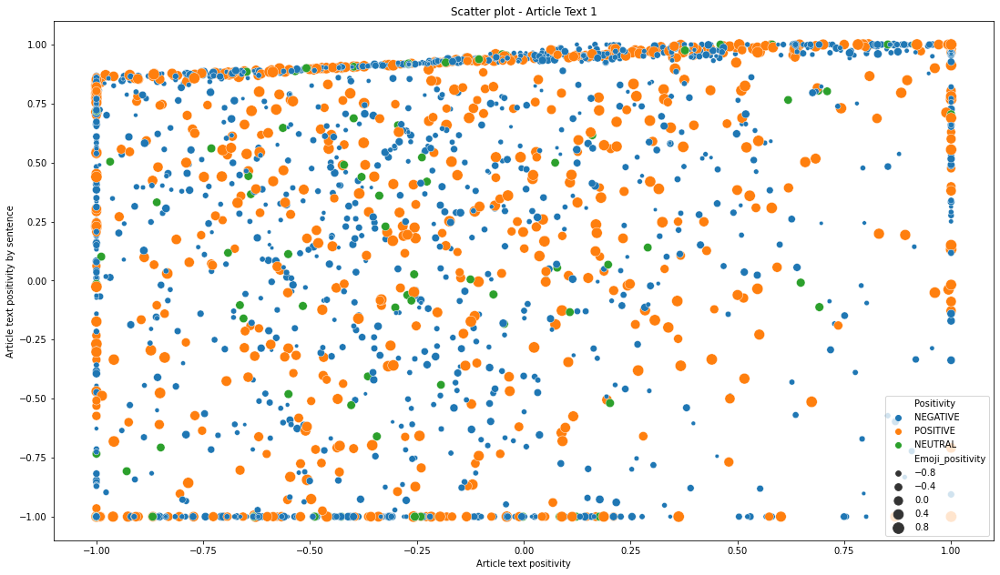

In [221]:
scatter_text_1 = sns.scatterplot(data = df_text, x='Text_positivity', y='Text_positivity_sentence', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Article Text 1')
plt.xlabel('Article text positivity')
plt.ylabel('Article text positivity by sentence')
plt.legend(loc='lower right')


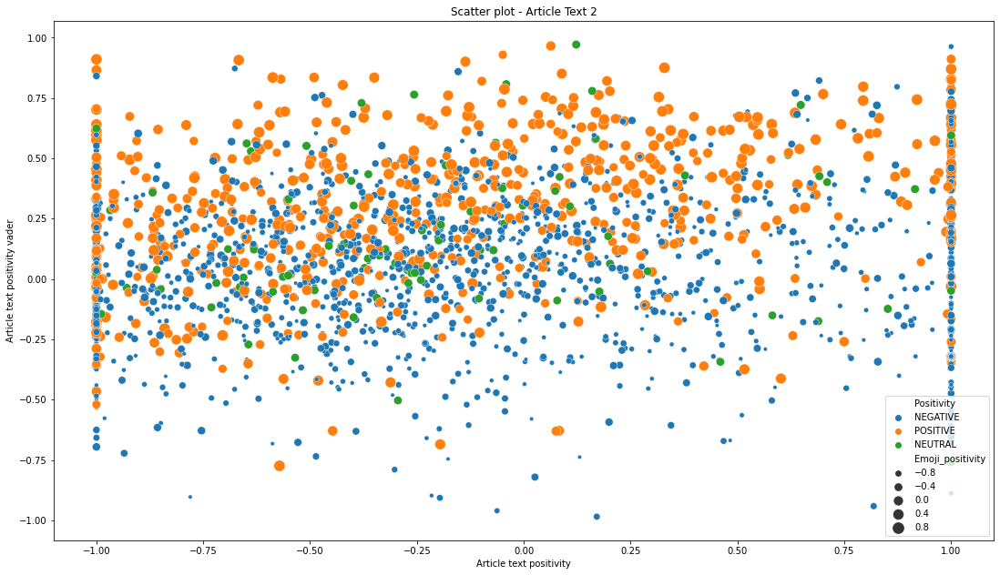

In [222]:
scatter_text_2 = sns.scatterplot(data = df_text, x='Text_positivity', y='Text_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Article Text 2')
plt.xlabel('Article text positivity')
plt.ylabel('Article text positivity vader')
plt.legend(loc='lower right')


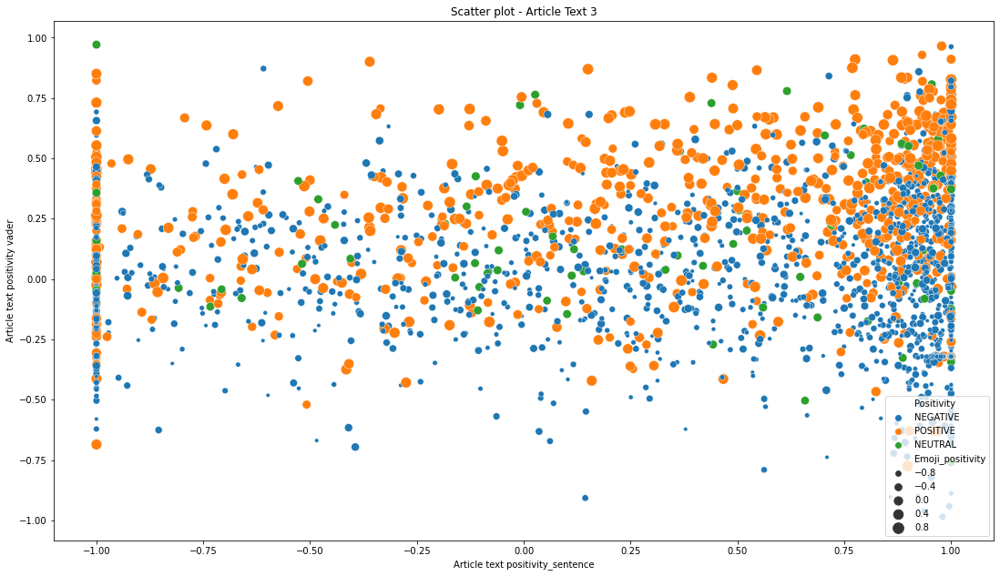

In [223]:
scatter_text_3 = sns.scatterplot(data = df_text, x='Text_positivity_sentence', y='Text_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Article Text 3')
plt.xlabel('Article text positivity_sentence')
plt.ylabel('Article text positivity vader')
plt.legend(loc='lower right')

## Scatter plots - Title

Text(0, 0.5, 'Title positivity by sentence')

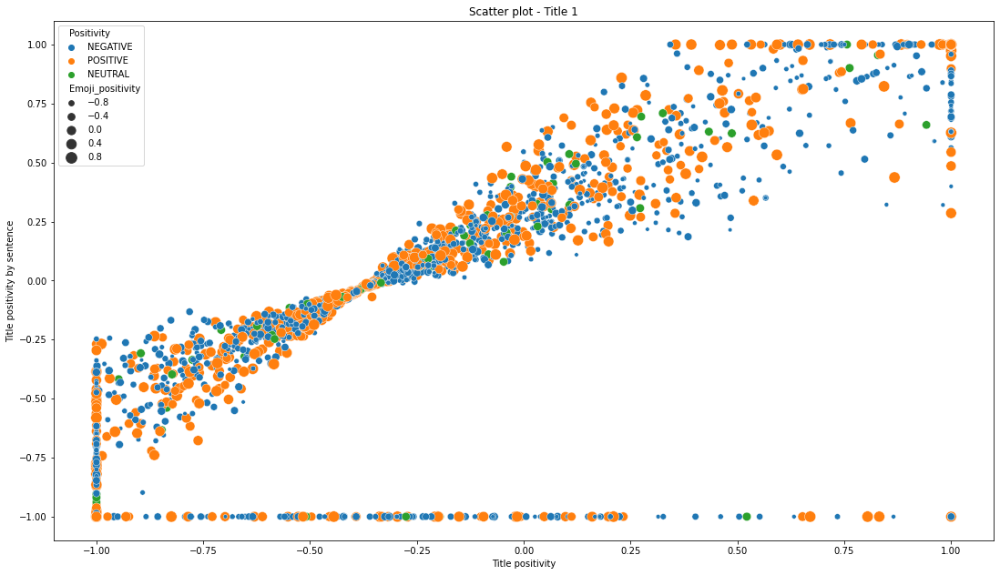

In [224]:
scatter_title_1 = sns.scatterplot(data = df_title, x='Title_positivity', y='Title_positivity_sentence', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Title 1')
plt.xlabel('Title positivity')
plt.ylabel('Title positivity by sentence')


Text(0, 0.5, 'Title positivity vader')

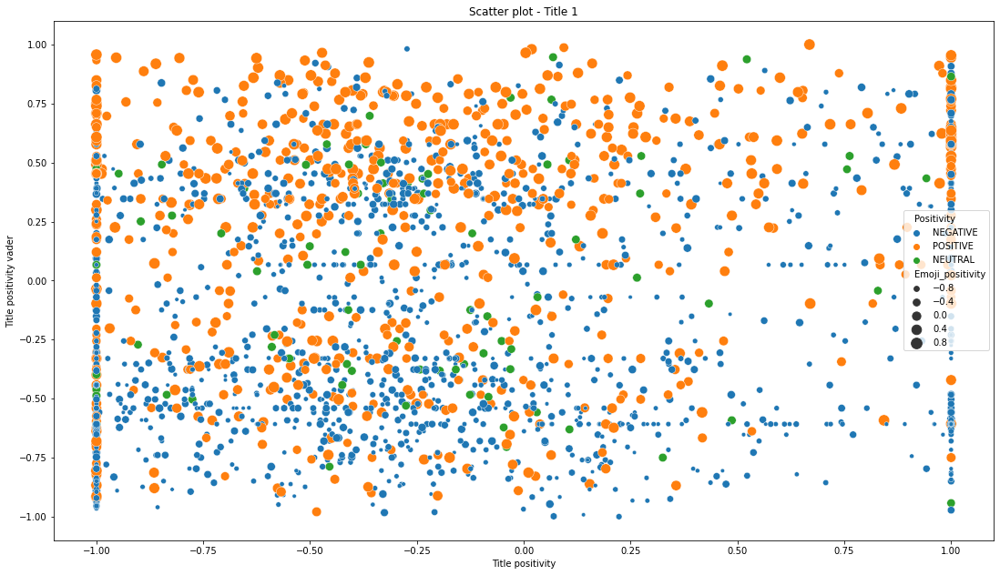

In [225]:
scatter_title_2 = sns.scatterplot(data = df_title, x='Title_positivity', y='Title_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Title 1')
plt.xlabel('Title positivity')
plt.ylabel('Title positivity vader')


Text(0, 0.5, 'Title positivity vader')

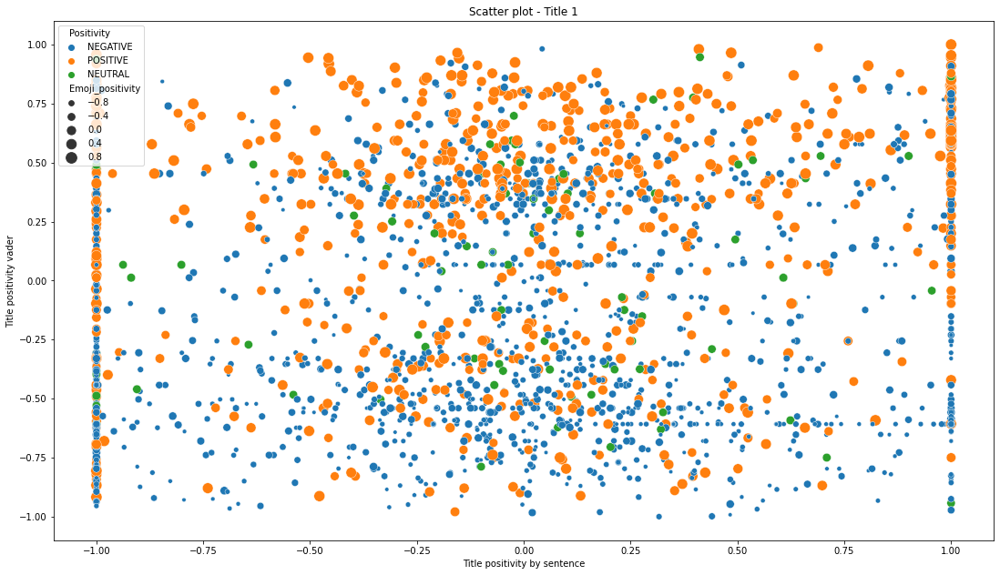

In [226]:
scatter_title_2 = sns.scatterplot(data = df_title, x='Title_positivity_sentence', y='Title_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Title 1')
plt.xlabel('Title positivity by sentence')
plt.ylabel('Title positivity vader')